# Fit the Data Spectra using simulations as models

- author Sylvie Dagoret-Campagne
- creation date : May 8th 2018
- affliliation : CNRS/IN2P3
- project : DESC-LSST



- need to increase the number of files to be open:

    ulimit -a
    
    ulimit -n 2048
    
    ulimit -Sn 10000

In [1]:
!ulimit -a

core file size          (blocks, -c) 0
data seg size           (kbytes, -d) unlimited
file size               (blocks, -f) unlimited
max locked memory       (kbytes, -l) unlimited
max memory size         (kbytes, -m) unlimited
open files                      (-n) 2048
pipe size            (512 bytes, -p) 1
stack size              (kbytes, -s) 8192
cpu time               (seconds, -t) unlimited
max user processes              (-u) 2837
virtual memory          (kbytes, -v) unlimited


## Setup

### Notebook style

In [2]:
from IPython.core.display import HTML
def css_styling():
    styles = open("../styles/custom.css", "r").read()
    return HTML(styles)
css_styling()

### import

In [3]:
import matplotlib.pyplot as plt
import sys
import os
import pandas as pd
import glob
from matplotlib.backends.backend_pdf import PdfPages 

In [4]:
import seaborn as sns

In [5]:
from scipy.optimize import curve_fit
from scipy import interpolate

In [6]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

### Figure style

In [7]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 10),   #defines the default image size
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [8]:
plt.rcParams.update({'figure.max_open_warning': 0}) # to see a large number of files

## Initialisation

### Spectractor

In [9]:
PATH_SPECTRACTOR='../../Spectractor'
PATH_SPECTRACTORSIM='../../SpectractorSim'
PATH_SPECTRACTORANAATM='../../SpectractorAnaAtm/common_tools'
PATH_GMAOMERRA='../merra2'

In [10]:
sys.path.append(PATH_SPECTRACTOR)
sys.path.append(PATH_SPECTRACTORSIM)
sys.path.append(PATH_SPECTRACTORANAATM)
sys.path.append(PATH_GMAOMERRA)

In [11]:
from spectractor import *
from libspecana import *
from spectractorsim import *

## Input spectra

### LogBook

In [12]:
file_logbook_csv=os.path.join(PATH_SPECTRACTOR,'ctiofulllogbook_jun2017_v4.csv')

In [13]:
df_ctio_lbk=pd.read_csv(file_logbook_csv,sep=';')

In [14]:
df_ctio_lbk.columns

Index([u'Unnamed: 0', u'date', u'subdir', u'index', u'object', u'filter',
       u'disperser', u'airmass', u'exposure', u'focus', u'seeing', u'P', u'T',
       u'RH', u'W', u'file', u'Obj-posXpix', u'Obj-posYpix', u'Dx', u'Dy',
       u'comment', u'skip'],
      dtype='object')

In [15]:
df_ctio_lbk=df_ctio_lbk.reindex(columns=['date','index','P','T','RH','airmass','seeing','exposure','object','filter','disperser','focus','W','subdir','file']).set_index('date').sort_index()

### Spectra Data

In [16]:
home=os.getenv('HOME')

In [17]:
path_data=os.path.join(home,'DATA/CTIODataJune2017_reduced_RG715_v2_prod1')
#path_data=os.path.join('/sps/lsst/data/AtmosphericCalibration','CTIODataJune2017_reduced_RG715_v2_prod1')

In [18]:
All_Subdirs=np.array(['data_28may17','data_29may17','data_30may17','data_31may17','data_01jun17','data_02jun17',
            'data_03jun17','data_04jun17','data_06jun17','data_08jun17','data_09jun17','data_10jun17',
            'data_12jun17','data_13jun17'])

In [19]:
Flag_Photometric_Nights=np.array([False,False,True,False,False,False,False,False,False,True,False,True,True,False])

In [20]:
photometric_indexes=np.where(Flag_Photometric_Nights)[0]

In [21]:
print 'Photometric indexes : ',photometric_indexes

Photometric indexes :  [ 2  9 11 12]


In [22]:
print 'Photometric nights : ',All_Subdirs[photometric_indexes]

Photometric nights :  ['data_30may17' 'data_08jun17' 'data_10jun17' 'data_12jun17']


### Sim spectra

In [23]:
PATH_SPECTRACTORSIM

'../../SpectractorSim'

In [24]:
# laptop:
path_sim=os.path.join(PATH_SPECTRACTORSIM,'sim_prod/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra')
# CCIN2P3:
#path_sim=PATH_SPECTRACTORSIM+'/sim_prod/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra'
# Office desktop
home=os.getenv('HOME')
path_sim=os.path.join(home,'DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra')

In [25]:
path_sim

'/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra'

## Selection of night

In [26]:
date="20170610"

In [27]:
idx_sel_subdir=11

In [28]:
SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)

### Logbook

In [29]:
all_obs=df_ctio_lbk.loc[(df_ctio_lbk["subdir"]==All_Subdirs[idx_sel_subdir])].sort_index()

In [30]:
all_obs_extr=all_obs[["index","object"]]

### path for spectra

In [31]:
path_spectra=os.path.join(path_data,All_Subdirs[idx_sel_subdir])
path_spectrasim=os.path.join(path_sim,All_Subdirs[idx_sel_subdir])

### find filename for data spectra

In [32]:
search_string=os.path.join(path_spectra,'*.fits')
all_spectrafiles=glob.glob(search_string)
all_spectrafiles=sorted(all_spectrafiles)

### extract the index from the data spectra filename

In [33]:
#SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)
all_sel_indexes=[]
for ffn in all_spectrafiles:
    all_sel_indexes.append(get_index_from_filename(ffn,SelectTagRe))
all_sel_indexes=np.array(all_sel_indexes)  

### extract the logbook rows

- use the indexes obtained to extract the relevant rows from the logbook

In [34]:
SelFlag=[]
for index, row in all_obs.iterrows():
  if row["index"] in all_sel_indexes:
    SelFlag.append(True)
  else:
    SelFlag.append(False)

In [35]:
sel_obs=all_obs[SelFlag]

### Quick view on the kind of sources

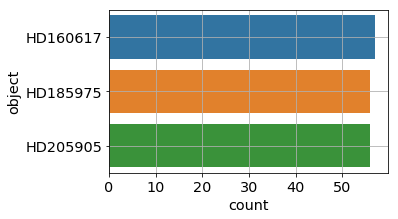

In [36]:
plt.figure(figsize=(5,3))
sns.countplot(y='object', data=sel_obs)
plt.grid(True)

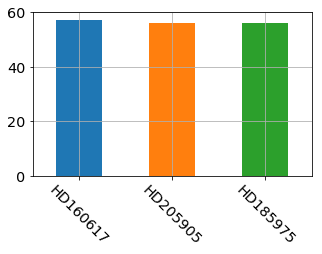

In [37]:
plt.figure(figsize=(5,3))
sel_obs['object'].value_counts().plot(kind='bar',rot=0)
plt.xticks(rotation=-45)
plt.grid(True)

### Remove bad sources

In [38]:
sel2_obs=sel_obs.loc[sel_obs['object'].isin(['HD160617','HD185975','HD205905'])]

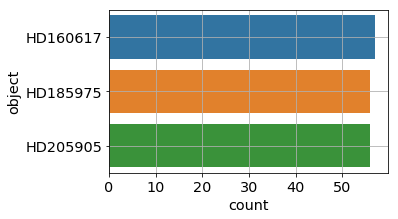

In [39]:
plt.figure(figsize=(5,3))
sns.countplot(y='object', data=sel2_obs)
plt.grid(True)

### Bad reconstructed spectra

In [40]:
bad_calib_indexes=np.array([136,137,138,148,149,150,160,161,162,172,173,174,184,185,186,196,197,198,208,209,210,
                           220,221,222,232,233,234,244,245,246,256,257,258,268,269,270,280,281,282,291,292,293,294])

## Remove bad indexes

In [41]:
file_toremove=[]
#SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)
for ffn in all_spectrafiles:
    fn=ffn.split('/')[-1]
    sel_index= int(re.findall(SelectTagRe,fn)[0])
    if sel_index in bad_calib_indexes:
        print ' remove ', fn
        file_toremove.append(ffn)
for f in file_toremove:
    all_spectrafiles.remove(f) 

 remove  reduc_20170610_136_spectrum.fits
 remove  reduc_20170610_137_spectrum.fits
 remove  reduc_20170610_138_spectrum.fits
 remove  reduc_20170610_148_spectrum.fits
 remove  reduc_20170610_149_spectrum.fits
 remove  reduc_20170610_150_spectrum.fits
 remove  reduc_20170610_160_spectrum.fits
 remove  reduc_20170610_161_spectrum.fits
 remove  reduc_20170610_162_spectrum.fits
 remove  reduc_20170610_172_spectrum.fits
 remove  reduc_20170610_173_spectrum.fits
 remove  reduc_20170610_174_spectrum.fits
 remove  reduc_20170610_184_spectrum.fits
 remove  reduc_20170610_185_spectrum.fits
 remove  reduc_20170610_186_spectrum.fits
 remove  reduc_20170610_196_spectrum.fits
 remove  reduc_20170610_197_spectrum.fits
 remove  reduc_20170610_198_spectrum.fits
 remove  reduc_20170610_208_spectrum.fits
 remove  reduc_20170610_209_spectrum.fits
 remove  reduc_20170610_210_spectrum.fits
 remove  reduc_20170610_220_spectrum.fits
 remove  reduc_20170610_221_spectrum.fits
 remove  reduc_20170610_222_spectr

### find filename for sim spectra

In [42]:
path_sim1=os.path.join(path_spectrasim,'clearsky')
path_sim2=os.path.join(path_spectrasim,'standard')
path_sim3=os.path.join(path_spectrasim,'merra2')

In [43]:
search_string=os.path.join(path_sim1,'*.fits')
all_simspectrafiles1=glob.glob(search_string)
all_simspectrafiles1=sorted(all_simspectrafiles1)

In [44]:
all_simspectrafiles1[:3]

['/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/clearsky/specsim_20170610_135_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/clearsky/specsim_20170610_136_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/clearsky/specsim_20170610_137_spectrum.fits']

In [45]:
search_string=os.path.join(path_sim2,'*.fits')
all_simspectrafiles2=glob.glob(search_string)
all_simspectrafiles2=sorted(all_simspectrafiles2)

In [46]:
all_simspectrafiles2[:3]

['/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/standard/specsim_20170610_135_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/standard/specsim_20170610_136_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/standard/specsim_20170610_137_spectrum.fits']

In [47]:
search_string=os.path.join(path_sim3,'*.fits')
all_simspectrafiles3=glob.glob(search_string)
all_simspectrafiles3=sorted(all_simspectrafiles3)

In [48]:
all_simspectrafiles3[:3]

['/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/merra2/specsim_20170610_135_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/merra2/specsim_20170610_136_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_10jun17/merra2/specsim_20170610_137_spectrum.fits']

# Example of a fit on spectrum

In [49]:
spectrum_sel=6
O2WL=762.1

In [50]:
s0=np.ones(len(WL))

In [51]:
def functofit_bad(x, x0, a, b):
    
    return np.where(x>x0, (a * (x-x0) * np.exp(-b * (x-x0) ))*s0,0)

In [52]:
def functofit(x, x0, a, b):
    """
    functofit : function to fit relative attenuation of data wrt simulation
    """
    return np.where(x>x0, (a + b * (x-x0) )*s0,0)

[ 3.00000000e+02  2.77189463e+00 -4.16040035e-03]


/Users/dagoret/anaconda2/lib/python2.7/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


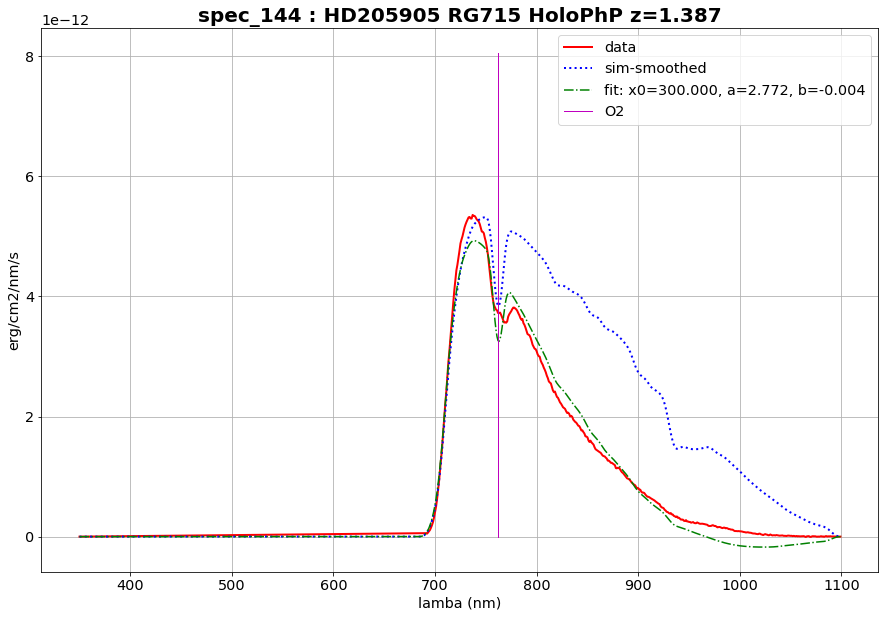

In [53]:
idx=spectrum_sel
filename=all_spectrafiles[idx]
file_id=get_index_from_filename(filename,SelectTagRe)
    
# check if tthe index is in the disperser indexes 
basefn=os.path.basename(filename)                  # basename of reconstruced spectra
basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
        
hdu1 = fits.open(filename)
hdu2 = fits.open(simfilename)
       
data1=hdu1[0].data
head1=hdu1[0].header
    
wl1=data1[0]
f1=data1[1]
   
hdu2 = fits.open(simfilename)
data2=hdu2[0].data
    
wl2=data2[0]
f2=data2[1]
f3=smooth(f2,window_len=21)

gain=f1.max()/f2.max()
f2=f3*gain

# extend range for (wl1,f1)
wl1=np.insert(wl1,0,WL[0])
f1=np.insert(f1,0,0.)            
wl1=np.append(wl1,WL[-1])
f1=np.append(f1,0.)

# extend range for (wl2,f3)
wl2=np.insert(wl2,0,WL[0])
f2=np.insert(f2,0,0.)            
wl2=np.append(wl2,WL[-1])
f2=np.append(f2,0.)


func1 = interpolate.interp1d(wl1, f1)
fl1=func1(WL)

func2 = interpolate.interp1d(wl2, f2)
fl2=func2(WL)

s0=fl2

if head1["FILTER2"]=='RG715':
    popt, pcov = curve_fit(functofit, WL, fl1,p0=[550.,1.,0.])
else:
    popt, pcov = curve_fit(functofit, WL, fl1,p0=[300.,1.,0.])

print popt

figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
plt.title(figtitle,fontsize='20',fontweight='bold')
#plt.plot(wl1,f1,'r-',lw=2,label='data')
plt.plot(WL,fl1,'r-',lw=2,label='data')
    
#plt.plot(wl2,f2*gain,'b-',lw=2,label='sim')
#plt.plot(wl2,f3*gain,'b:',lw=2,label='sim-smoothed')
plt.plot(WL,fl2,'b:',lw=2,label='sim-smoothed')

s0=fl2
plt.plot(WL,functofit(WL, *popt), 'g-.',label='fit: x0=%5.3f, a=%5.3f, b=%5.3f' % tuple(popt))


plt.plot([O2WL,O2WL],[0.,f1.max()*1.5],'m-',lw=1,label='O2')
plt.xlabel("lamba (nm)")
plt.ylabel("erg/cm2/nm/s")
plt.grid(True)
plt.legend()

# Plot spectra

In [54]:
NBSPECTRA=len(all_spectrafiles)

In [55]:
NBPLOTS=NBSPECTRA

In [56]:
O2WL=762.1

In [57]:
def ShiftSpectrum(wl,flux,wlline=O2WL,wlmin=O2WL-40.,wlmax=O2WL+40.):
    """
    Function. ShiftSpectrum(wl,flux,wlline=O2WL,wlmin=O2WL-10.,wlmax=O2WL+10.)
    
    Function to adjust the wavelength calibration by shifting a little bit the wavelength axis, such
    O2 lines are aligned.
    
    
    input:
       wl,flux: the whole wavelength and flux of spectrum
       wlline=O2WL    : wavelength on which to aligh the spectra
       wlmin=O2WL-10. : boundary of adjustment 
       wlmax=O2WL+10. : boundary of adjustment 
    
    
    """
    shiftwl=0
    
    index_selection=np.where(np.logical_and(wl>=wlmin,wl<=wlmax))[0]
    #print index_selection
    if index_selection.size !=0:
        wl_subset=wl[index_selection]
        flux_subset=flux[index_selection]
        the_flux_min_idx=np.where(flux_subset==flux_subset.min())[0]
        if the_flux_min_idx.size==1:
            the_flux_min_index=index_selection[the_flux_min_idx[0]]
            shiftwl=O2WL-wl[the_flux_min_index]
            #print the_flux_min_index, shiftwl
    return shiftwl

# First step : Correct for unknown attenuation 

/Users/dagoret/anaconda2/lib/python2.7/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


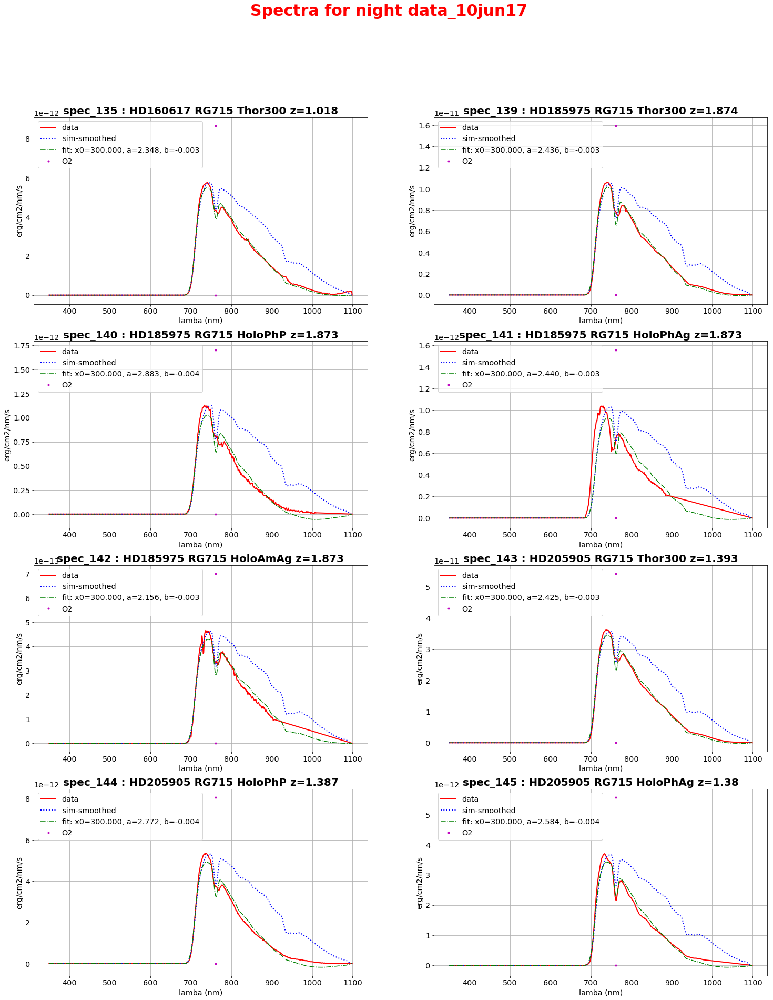

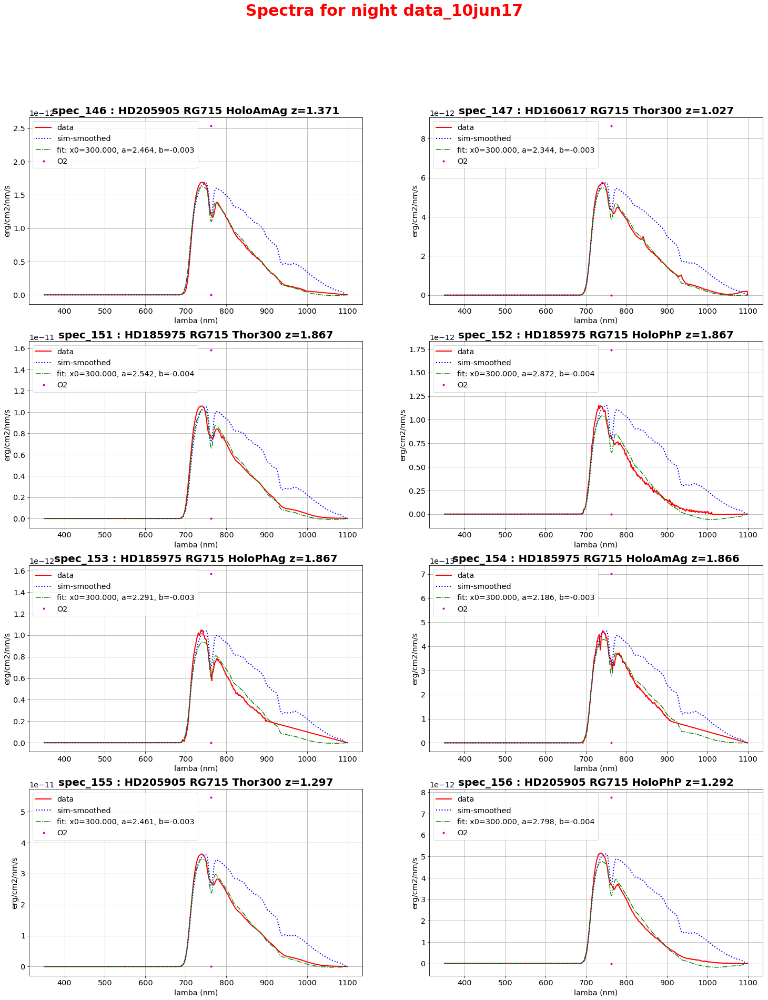

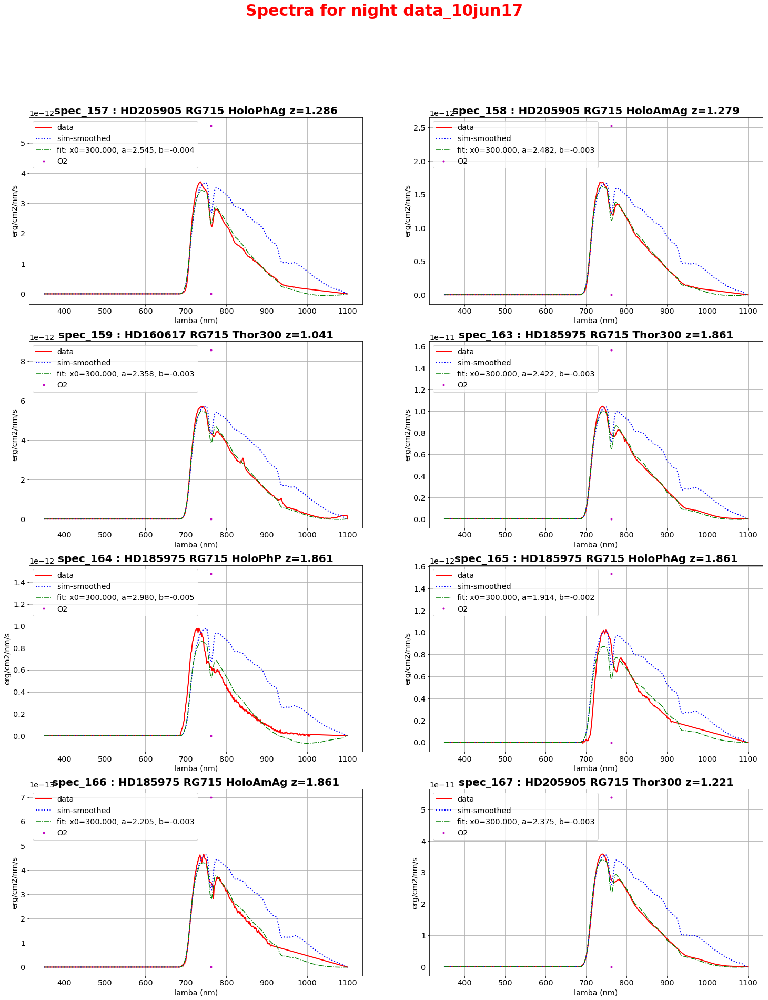

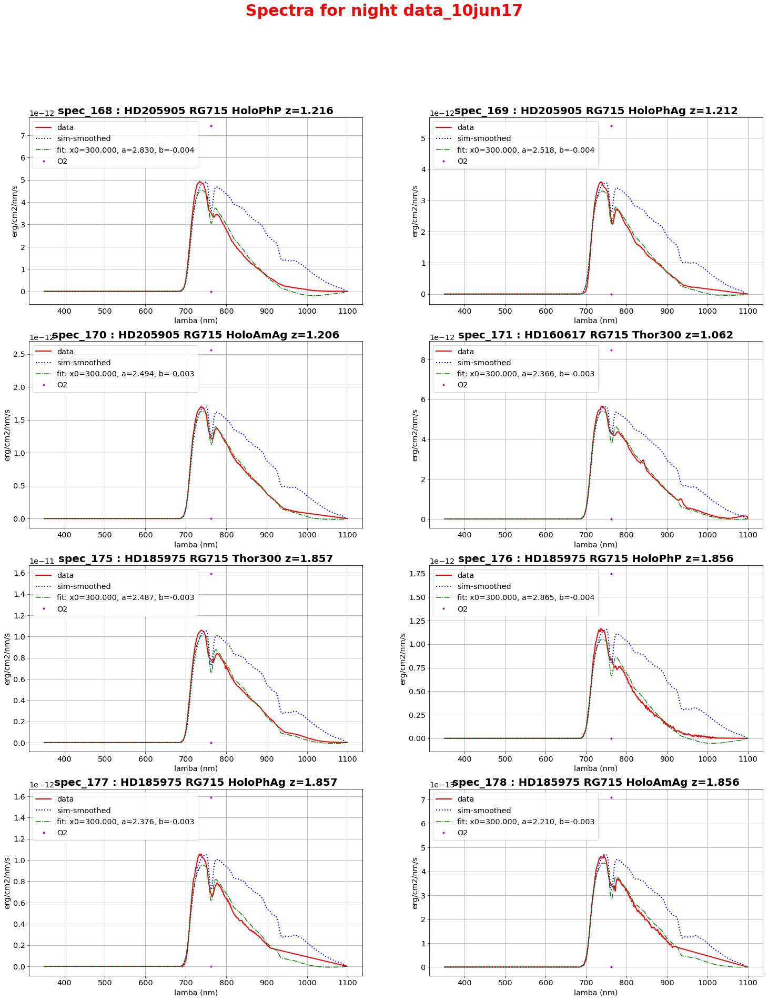

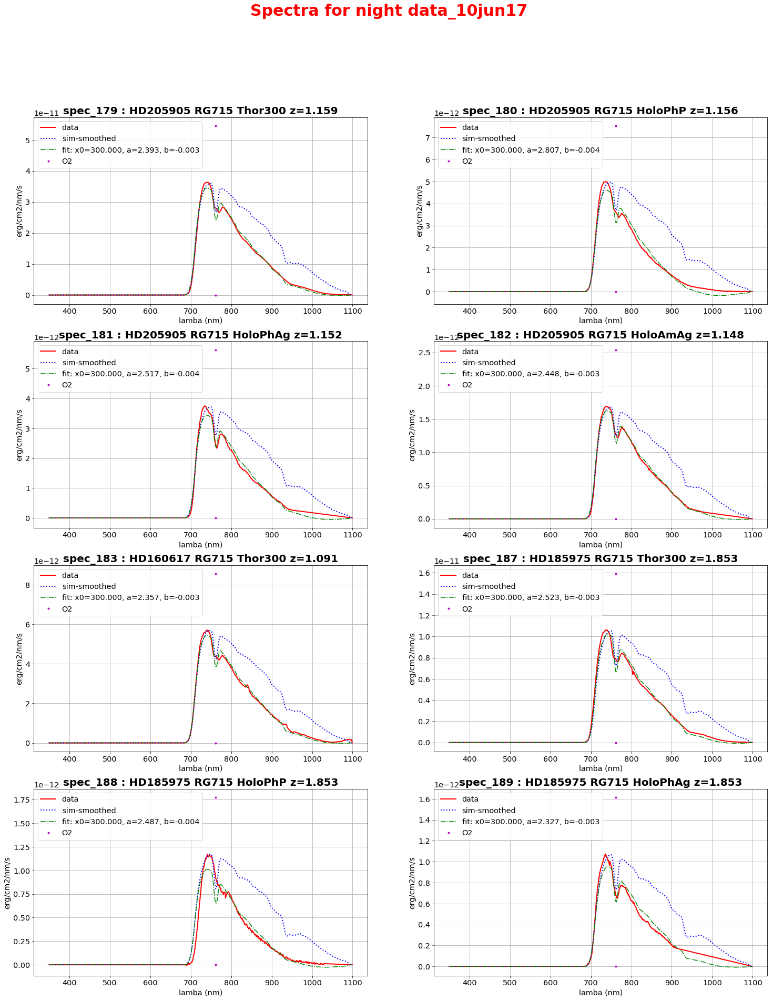

...

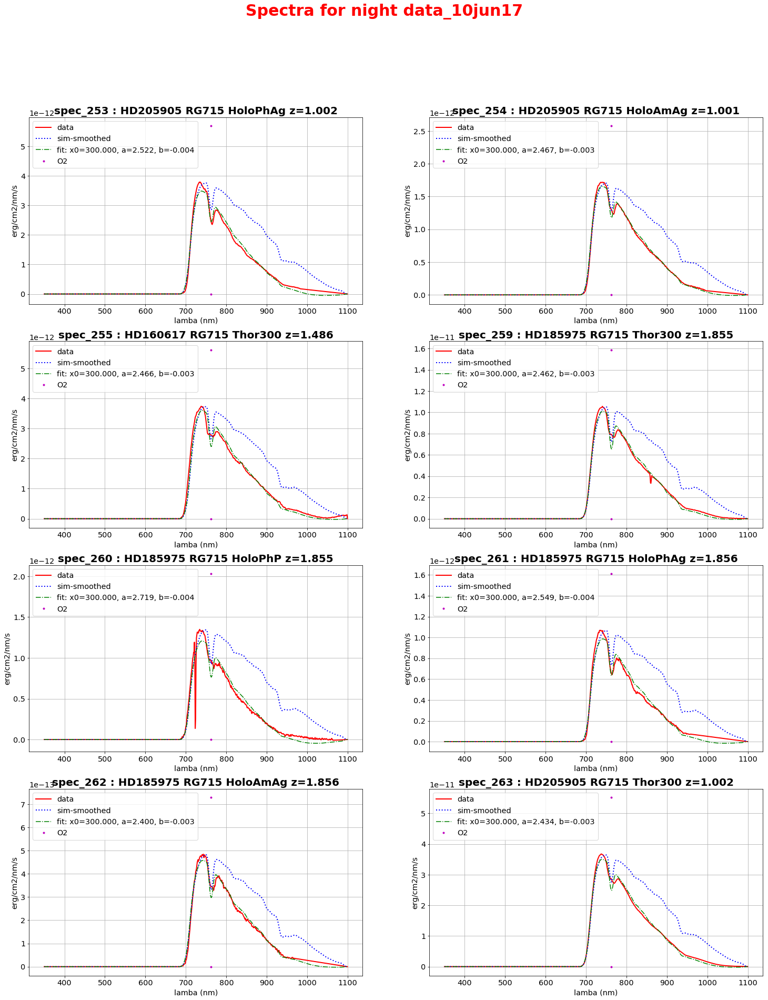

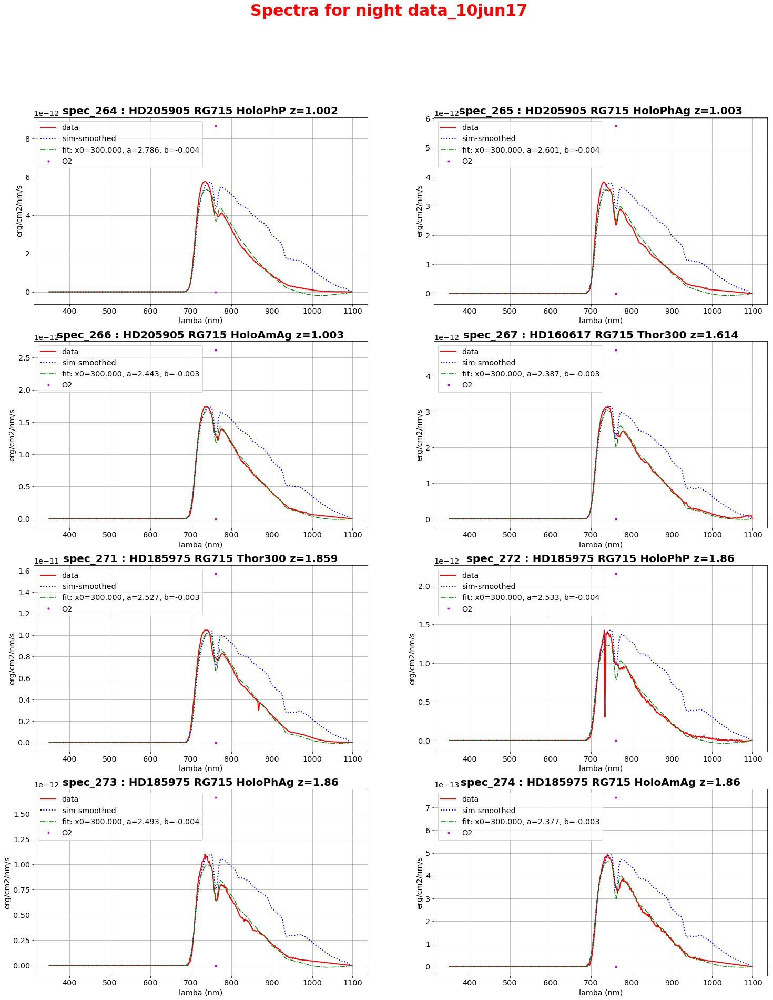

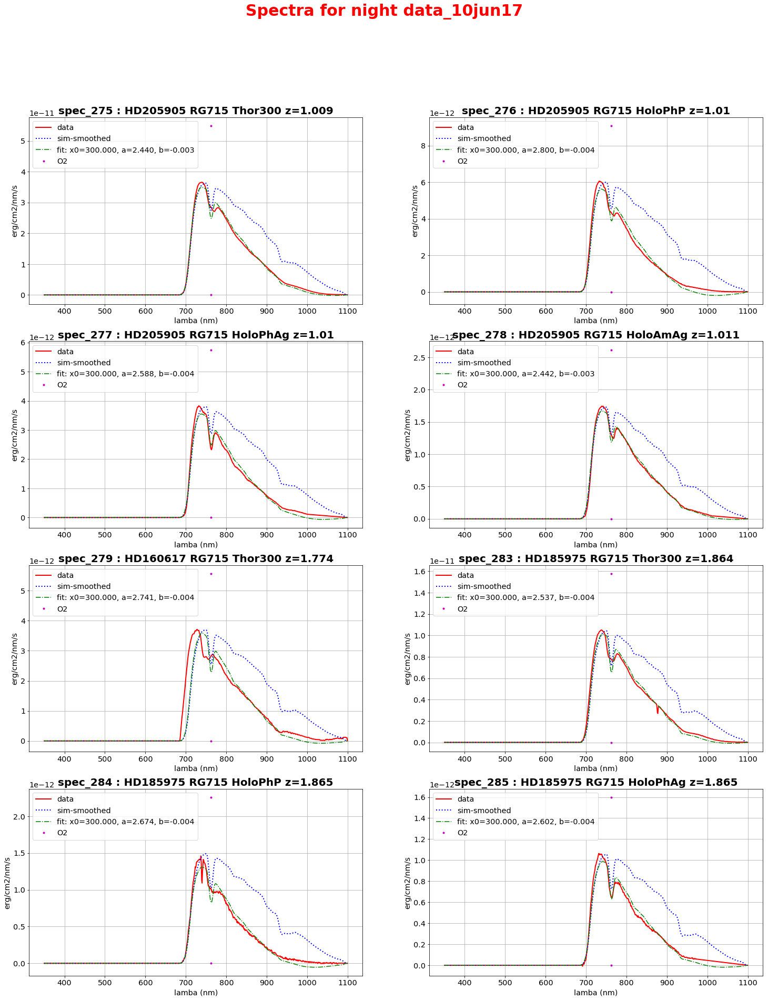

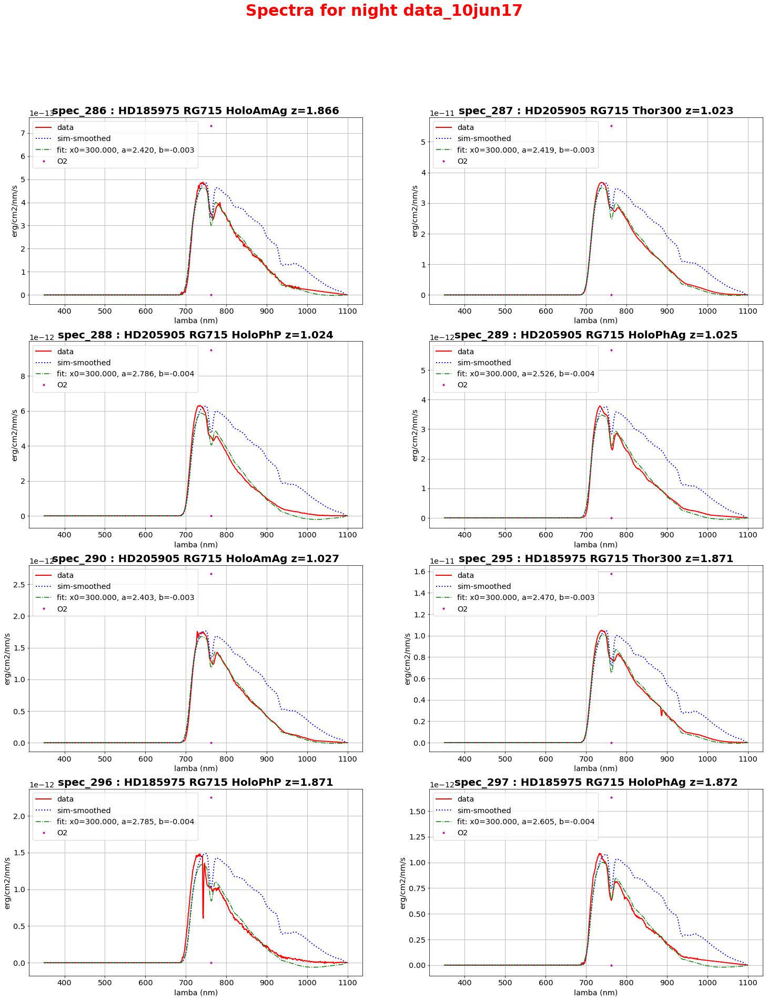

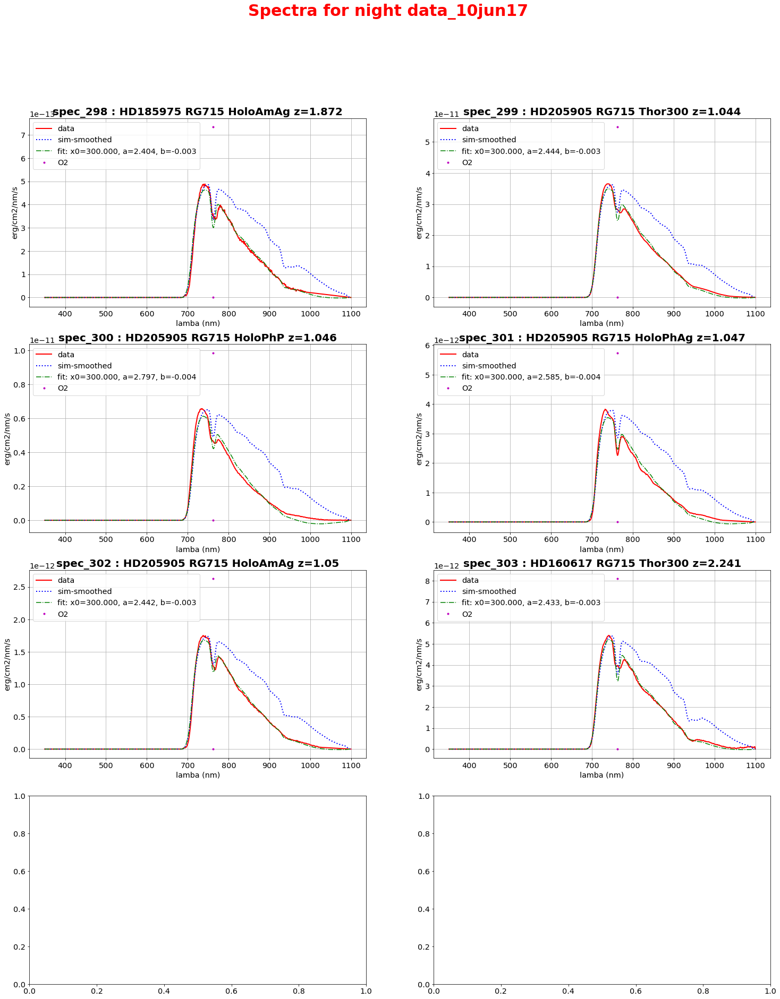

In [58]:
NBPLOTS=NBSPECTRA

all_indexes=[]
all_renormfluxsim=[]
all_data=[]
all_dataerr=[]

title='Spectra for night '+All_Subdirs[idx_sel_subdir]
PageNum=0          # page counter
NBIMGPERROW=2
NBIMGROWPERPAGE=4

figfilename=os.path.join('FitSpectra.pdf')
pp = PdfPages(figfilename) # create a pdf file

# loop on plots
for idx in np.arange(NBPLOTS):
    
    
    if idx%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,fontsize=30,fontweight='bold',color='red')
            
    # index of image in the page    
    index=idx-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
    ix=index%NBIMGPERROW
    iy=index/NBIMGPERROW
                        
    filename=all_spectrafiles[idx]
    file_id=get_index_from_filename(filename,SelectTagRe)
    
     # check if tthe index is in the disperser indexes 
    basefn=os.path.basename(filename)                  # basename of reconstruced spectra
    basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
    simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
    
    
    all_indexes.append(file_id)
    
    hdu1 = fits.open(filename)
    hdu2 = fits.open(simfilename)
       
    data1=hdu1[0].data
    head1=hdu1[0].header
    
    wl1=data1[0]
    f1=data1[1]
    ef1=data1[2]
   
    hdu2 = fits.open(simfilename)
    data2=hdu2[0].data
    
    wl2=data2[0]
    f2=data2[1]
    #f3=smooth(f2)
    f3=smooth(f2,window_len=21)
    
    gain=f1.max()/f2.max()
    
    # renormelize scale of simu
    f2=f3*gain

    # extend range for (wl1,f1)
    wl1=np.insert(wl1,0,wl1[0]-5)
    f1=np.insert(f1,0,0.)  
    ef1=np.insert(ef1,0,0.) 
    
    wl1=np.insert(wl1,0,WL[0])
    f1=np.insert(f1,0,0.) 
    ef1=np.insert(ef1,0,0.)
    
    wl1=np.append(wl1,WL[-1])
    f1=np.append(f1,0.)
    ef1=np.append(ef1,0.)
    
    

    # extend range for (wl2,f3)
    wl2=np.insert(wl2,0,WL[0])
    f2=np.insert(f2,0,0.)            
    wl2=np.append(wl2,WL[-1])
    f2=np.append(f2,0.)


    func1 = interpolate.interp1d(wl1, f1)
    fl1=func1(WL)
    
    efunc1 = interpolate.interp1d(wl1, ef1)
    efl1=efunc1(WL)

    func2 = interpolate.interp1d(wl2, f2)
    fl2=func2(WL)

    s0=fl2

    all_data.append(fl1)
    all_dataerr.append(efl1)
    
    # fit  attenuation 
    # -----------------
    if head1["FILTER2"]=='RG715':
        popt, pcov = curve_fit(functofit, WL, fl1,p0=[550.,1.,0.])
    else:
        popt, pcov = curve_fit(functofit, WL, fl1,p0=[300.,1.,0.])

    # plot
    # --------    
    
    figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
    axarr[iy,ix].set_title(figtitle,fontsize='20',fontweight='bold')
    axarr[iy,ix].plot(WL,fl1,'r-',lw=2,label='data')
    axarr[iy,ix].plot(WL,fl2,'b:',lw=2,label='sim-smoothed')
    axarr[iy,ix].plot(WL,functofit(WL, *popt), 'g-.',label='fit: x0=%5.3f, a=%5.3f, b=%5.3f' % tuple(popt))
    
    all_renormfluxsim.append(functofit(WL, *popt))
    
    
    axarr[iy,ix].plot([O2WL,O2WL],[0.,f1.max()*1.5],'m.',lw=1,label='O2')
    axarr[iy,ix].set_xlabel("lamba (nm)")
    axarr[iy,ix].set_ylabel("erg/cm2/nm/s")
    
    
    axarr[iy,ix].grid(True)
    #axarr[iy,ix].set_xlim(O2WL-100,O2WL+100) 
    axarr[iy,ix].legend() 
    
    hdu1.close()
    hdu2.close()
   
    # save a new page
    if (idx+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
        PageNum+=1  # increase page Number
        f.savefig(pp, format='pdf')
        f.show()
        #break
        
        
    #idx+=1    # increase counter on plots
     

f.savefig(pp, format='pdf') 
f.show()
pp.close()

## Step two : shift the wavelength

In [59]:
all_indexes=np.array(all_indexes)
all_renormfluxsim=np.array(all_renormfluxsim)
all_data=np.array(all_data)
all_dataerr=np.array(all_dataerr)

In [60]:
wavelength_shift=np.arange(-50,51,1)

In [61]:
np.where(all_indexes==4)[0]

array([], dtype=int64)

In [62]:
print all_indexes

[135 139 140 141 142 143 144 145 146 147 151 152 153 154 155 156 157 158
 159 163 164 165 166 167 168 169 170 171 175 176 177 178 179 180 181 182
 183 187 188 189 190 191 192 193 194 195 199 200 201 202 203 204 205 206
 207 211 212 213 214 215 216 217 218 219 223 224 225 226 227 228 229 230
 231 235 236 237 238 239 240 241 242 243 247 248 249 250 251 252 253 254
 255 259 260 261 262 263 264 265 266 267 271 272 273 274 275 276 277 278
 279 283 284 285 286 287 288 289 290 295 296 297 298 299 300 301 302 303]


In [65]:
idx=0

In [66]:
data=all_data[idx]
simu=all_renormfluxsim[idx]
edata=all_dataerr[idx]

In [68]:
data.shape,simu.shape,edata.shape

((750,), (750,), (750,))

In [69]:
def ComputeChi2TimeShift(data,edata,simu):
    """
    Function ComputeChi2TimeShift(data,edata,simu)
    
    input:
        - data
        - edata
        - simu
    output:
    
    """

    all_chi2=[]

    for dwl in wavelength_shift:
        #newsimu=np.roll(simu,dwl)
        newsimu=roll_zeropad(simu,dwl)
        chi2=np.where(edata>0,(data-newsimu)**2/edata**2,0.)
        chi2=chi2.sum()
        all_chi2.append(chi2)
    
    return np.array(all_chi2)

/Users/dagoret/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in divide
/Users/dagoret/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in divide


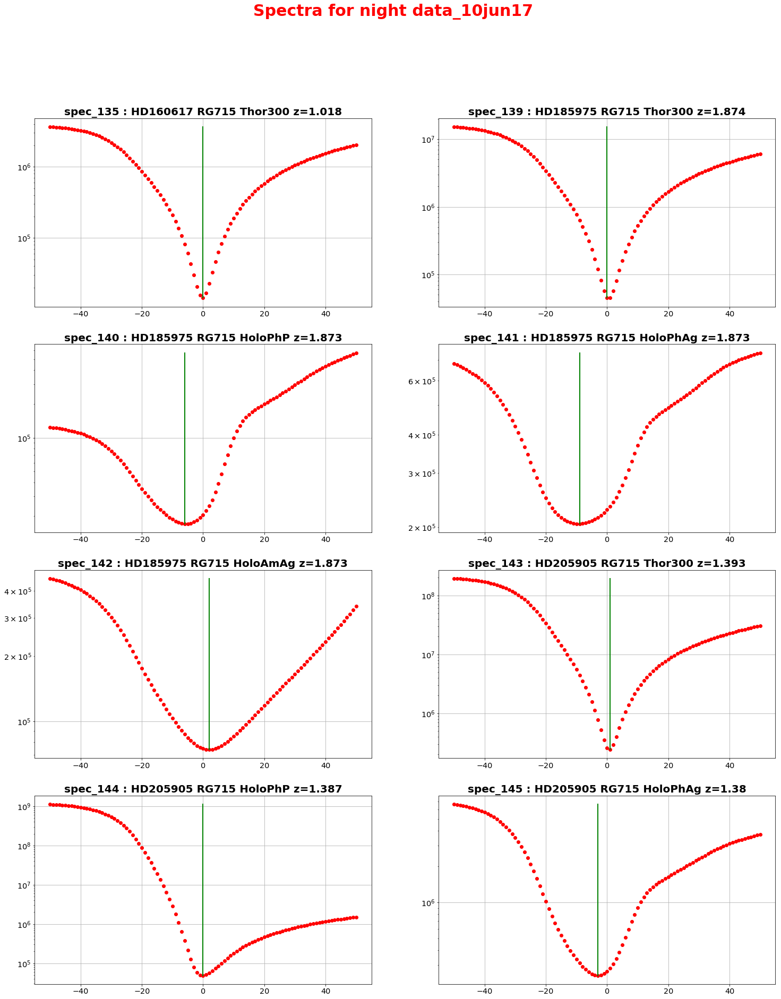

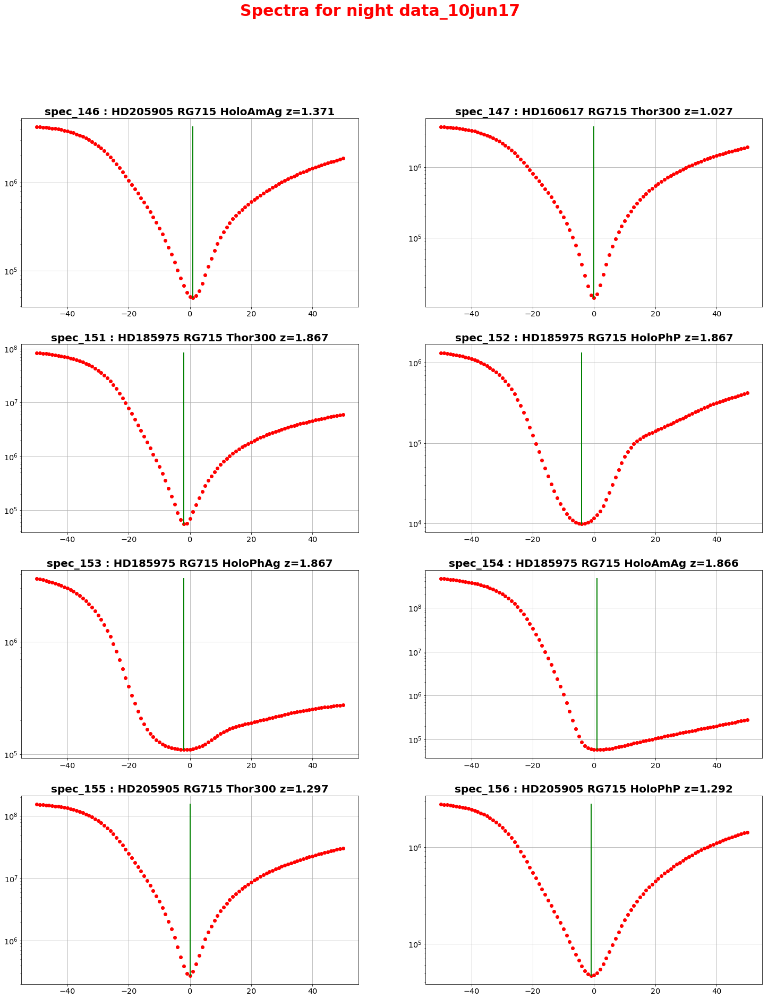

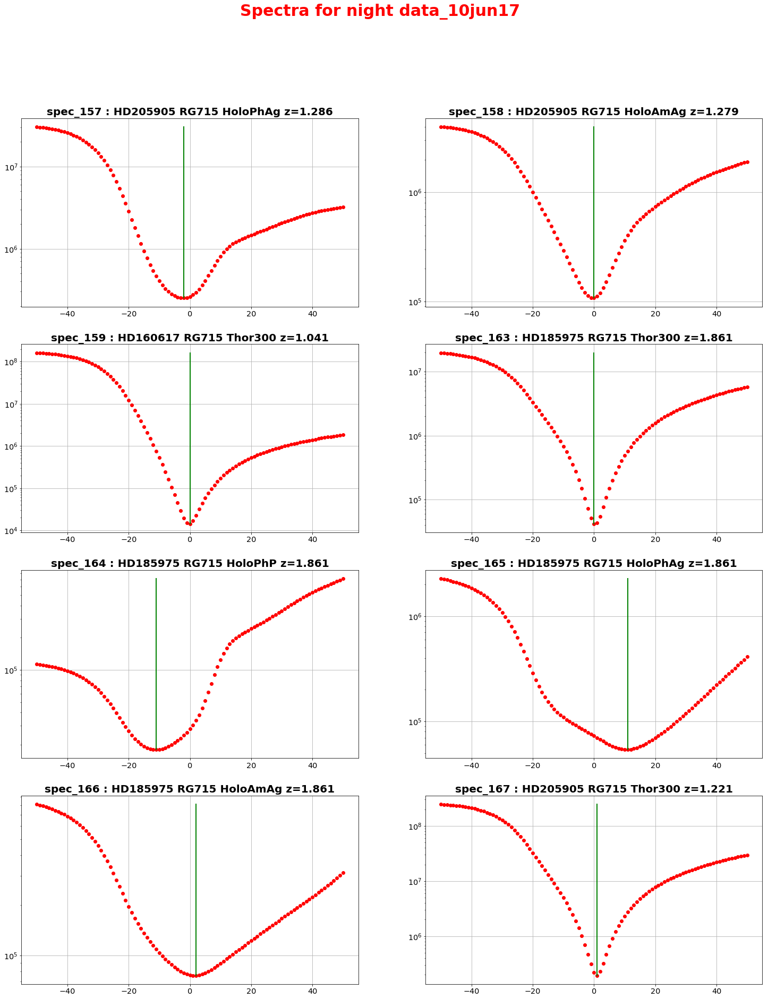

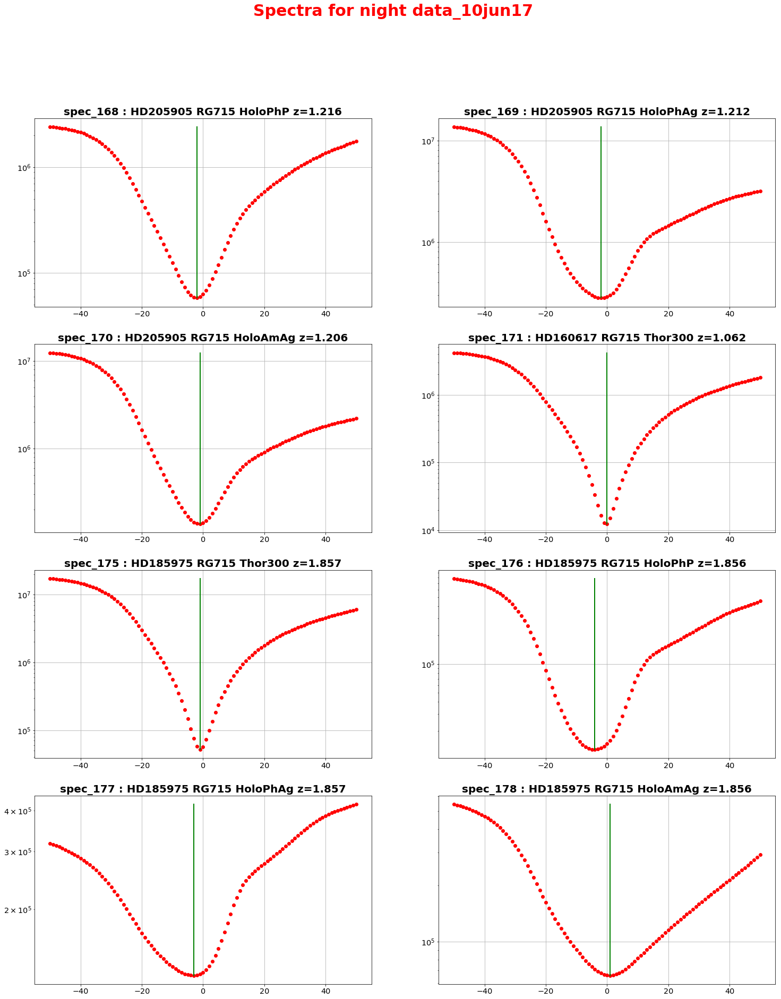

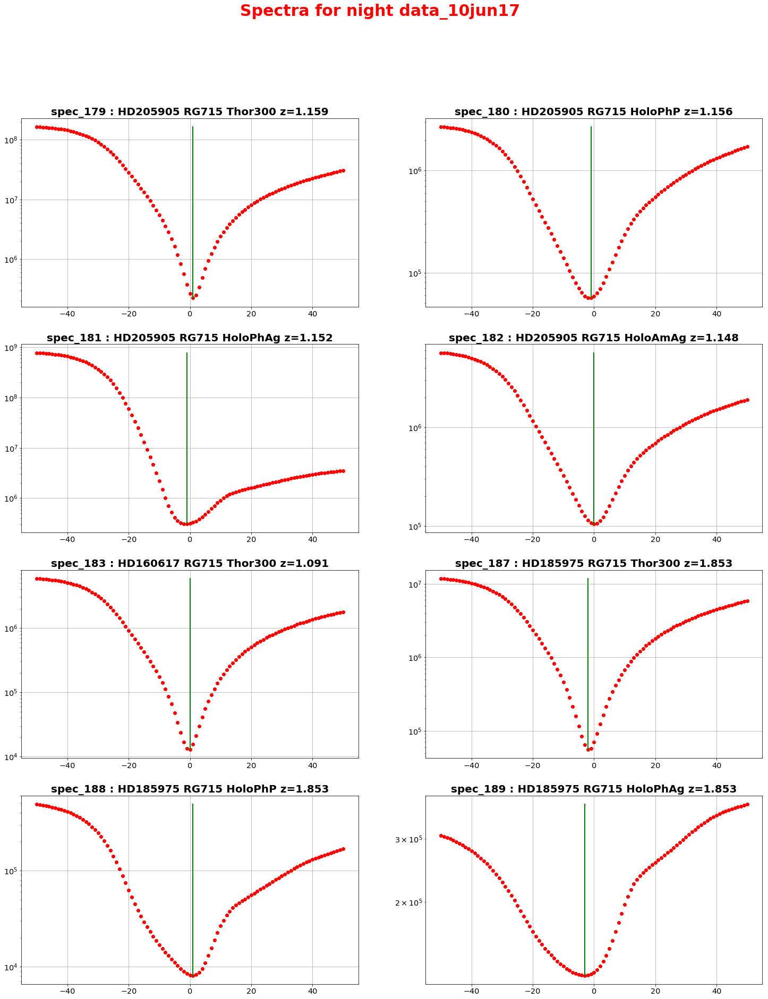

...

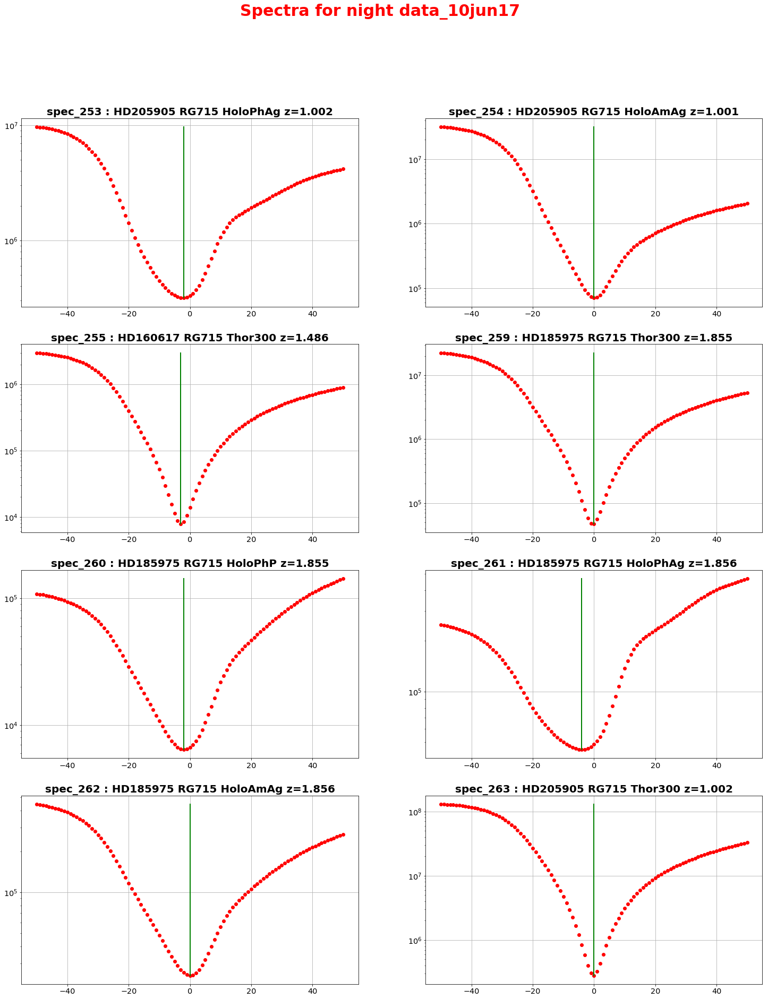

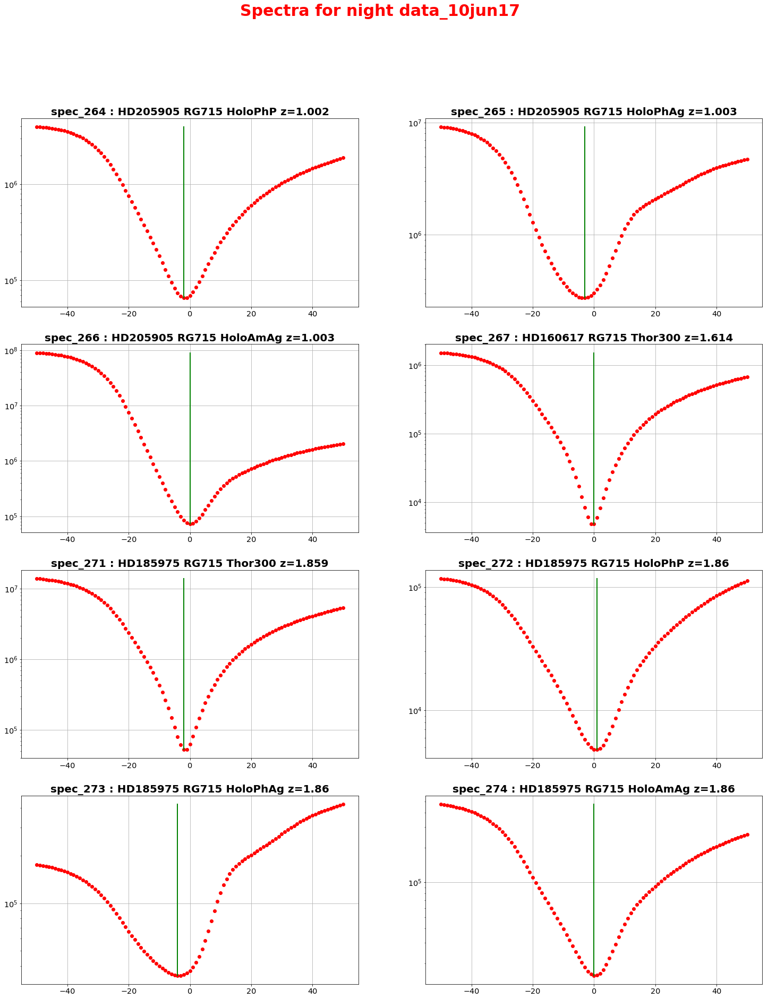

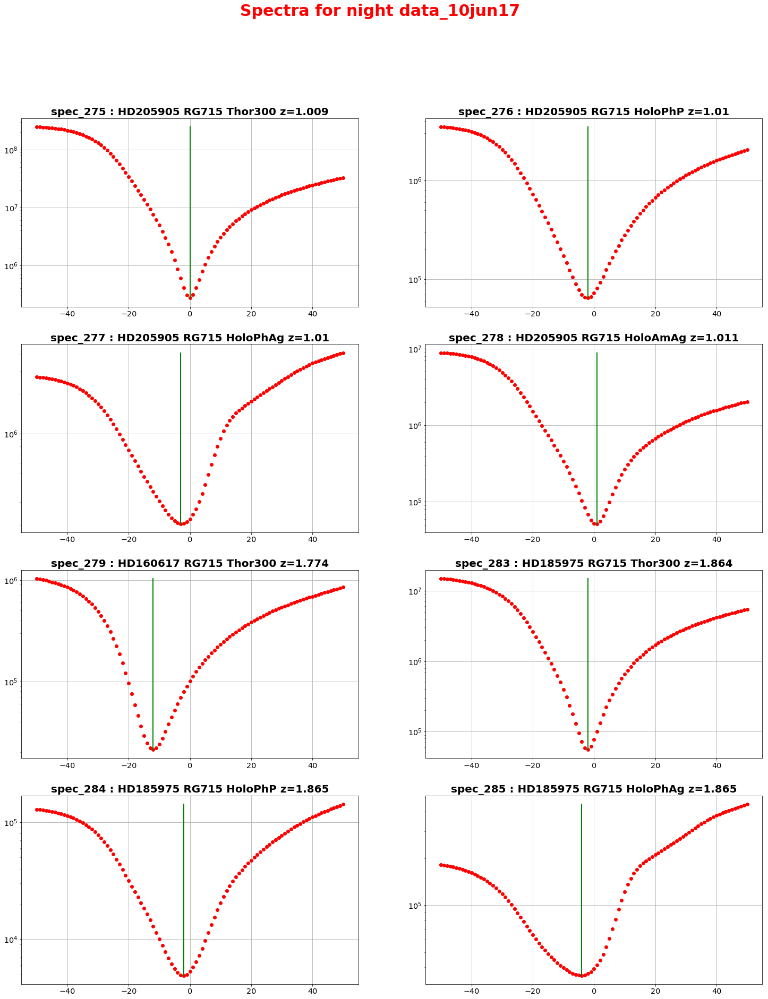

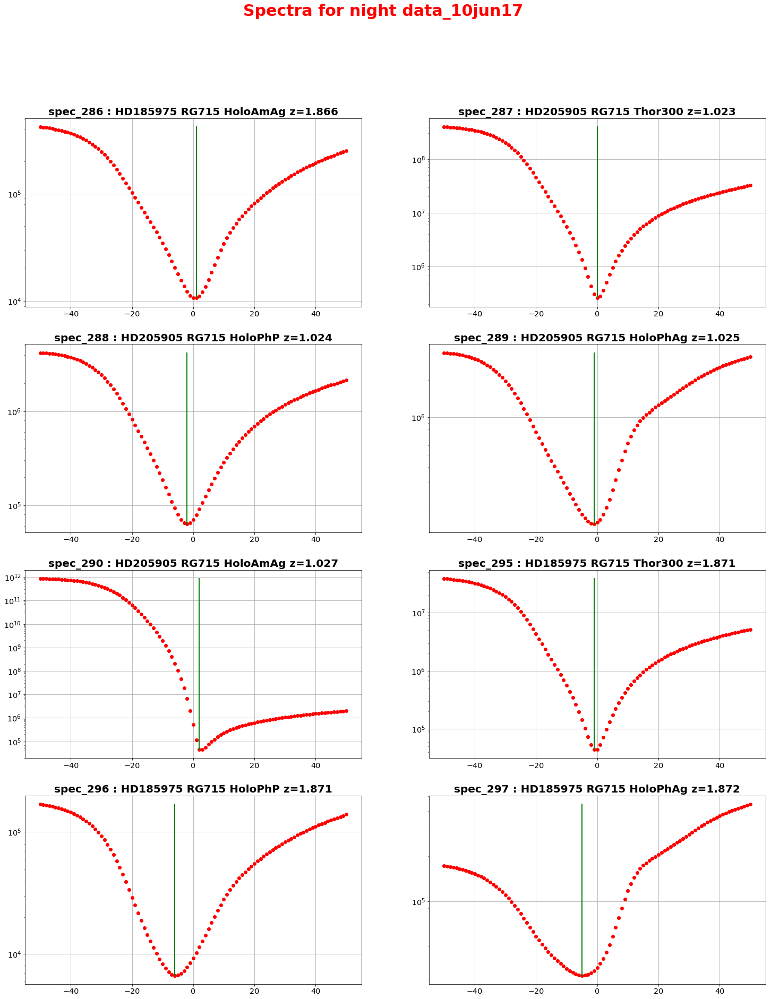

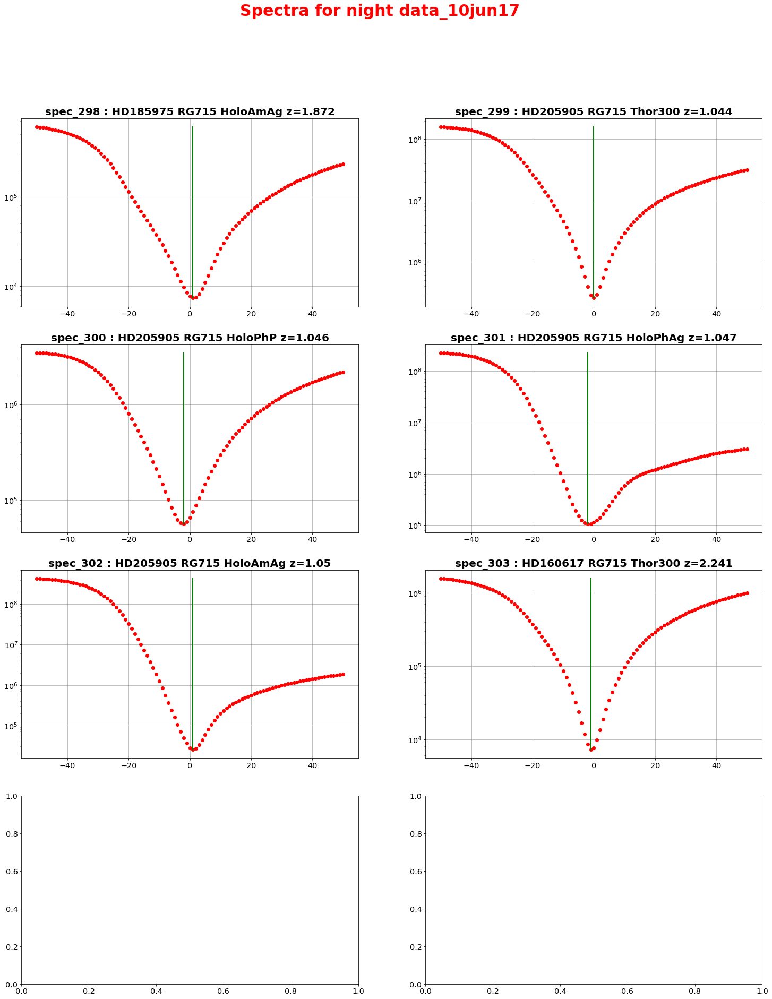

In [70]:
NBPLOTS=NBSPECTRA

all_wavelength_toshift=[]

#definition of the filename and page setup
figfilename=os.path.join('ShiftedSpectraChi2.pdf')
pp = PdfPages(figfilename) # create a pdf file
title='Spectra for night '+All_Subdirs[idx_sel_subdir]
PageNum=0          # page counter
NBIMGPERROW=2
NBIMGROWPERPAGE=4

wavelength_shift=np.arange(-50,51,1)

idx=0 # counter on plots
# loop on plots
for idx in np.arange(NBPLOTS):
       
    if idx%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,fontsize=30,fontweight='bold',color='red')
    
    
    # index of image in the page    
    index=idx-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
    ix=index%NBIMGPERROW
    iy=index/NBIMGPERROW
    
    
    filename=all_spectrafiles[idx]
    
      # check if tthe index is in the disperser indexes 
    basefn=os.path.basename(filename)                  # basename of reconstruced spectra
    basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
    simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
    
    
    #simfilename=all_simspectrafiles1[idx]
    
    file_id=get_index_from_filename(filename,SelectTagRe)
    
    hdu1 = fits.open(filename)
    hdu2 = fits.open(simfilename)
       
    data1=hdu1[0].data
    wl1=data1[0]
    f1=data1[1]
   
    
    figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
    data=all_data[idx]
    simu=all_renormfluxsim[idx]
    edata=all_dataerr[idx]
    
    all_chi2=ComputeChi2TimeShift(data,edata,simu)
    
    idx_timeshift=np.where(all_chi2==all_chi2.min())[0][0]
    ts=wavelength_shift[idx_timeshift]
    
    all_wavelength_toshift.append(ts)
    
    axarr[iy,ix].set_title(figtitle,fontsize='20',fontweight='bold')
    axarr[iy,ix].semilogy(wavelength_shift,all_chi2,'ro',lw=2)
    axarr[iy,ix].semilogy([ts,ts],[all_chi2.min(),all_chi2.max()],'g-',lw=2)
    axarr[iy,ix].grid(True)
    
   
   
    # save a new page
    if (idx+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
        #f.colorbar(im, orientation="horizontal")
        PageNum+=1  # increase page Number
        f.savefig(pp, format='pdf')
        f.show()
        
        
    #idx+=1    # increase counter on plots
    
    
f.savefig(pp, format='pdf') 
f.show()
pp.close()
all_wavelength_toshift=np.array(all_wavelength_toshift)

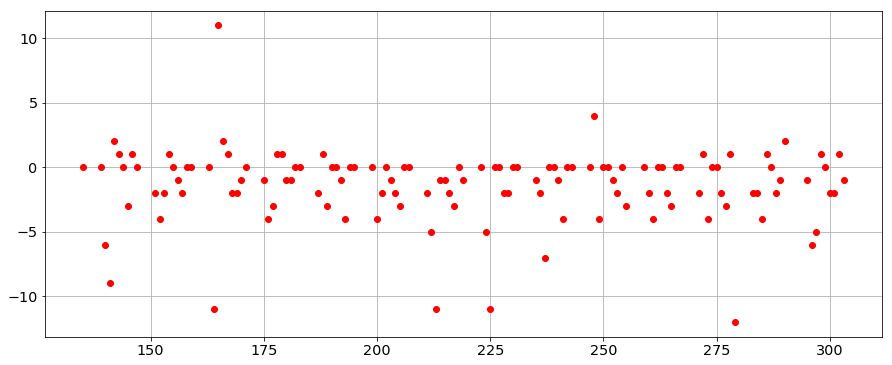

In [71]:
plt.figure(figsize=(15,6))
plt.plot(all_indexes,all_wavelength_toshift,'ro')
plt.grid()

# Final shifted spectra

In [72]:
all_wl_spec_shift=np.zeros(len(all_wavelength_toshift))-all_wavelength_toshift

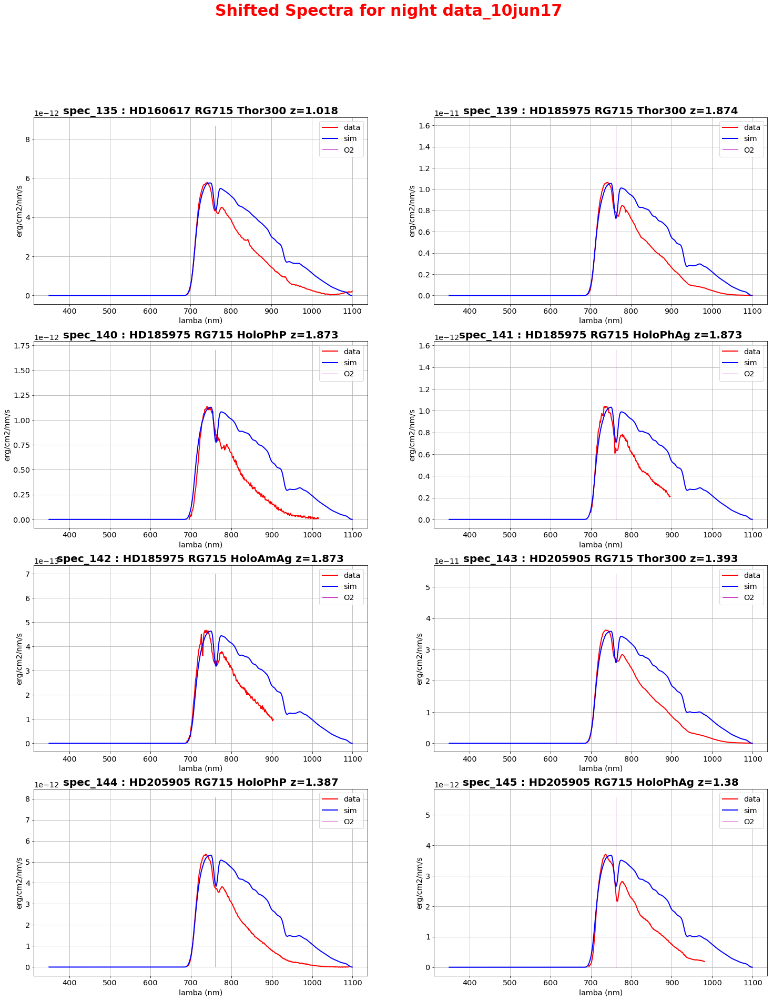

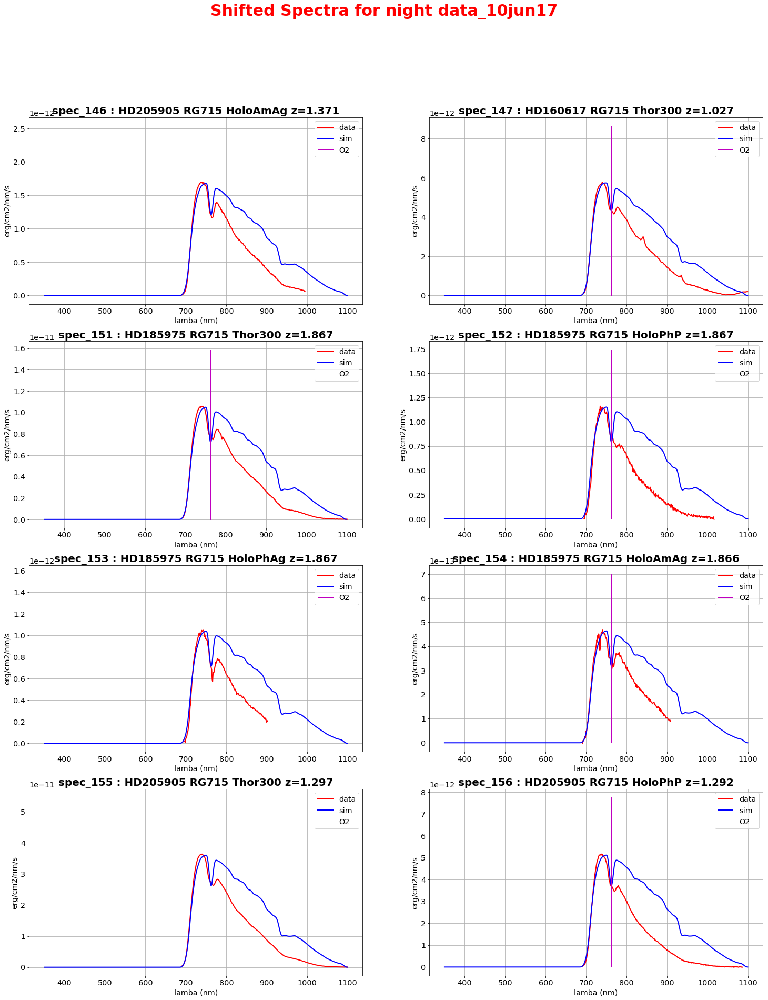

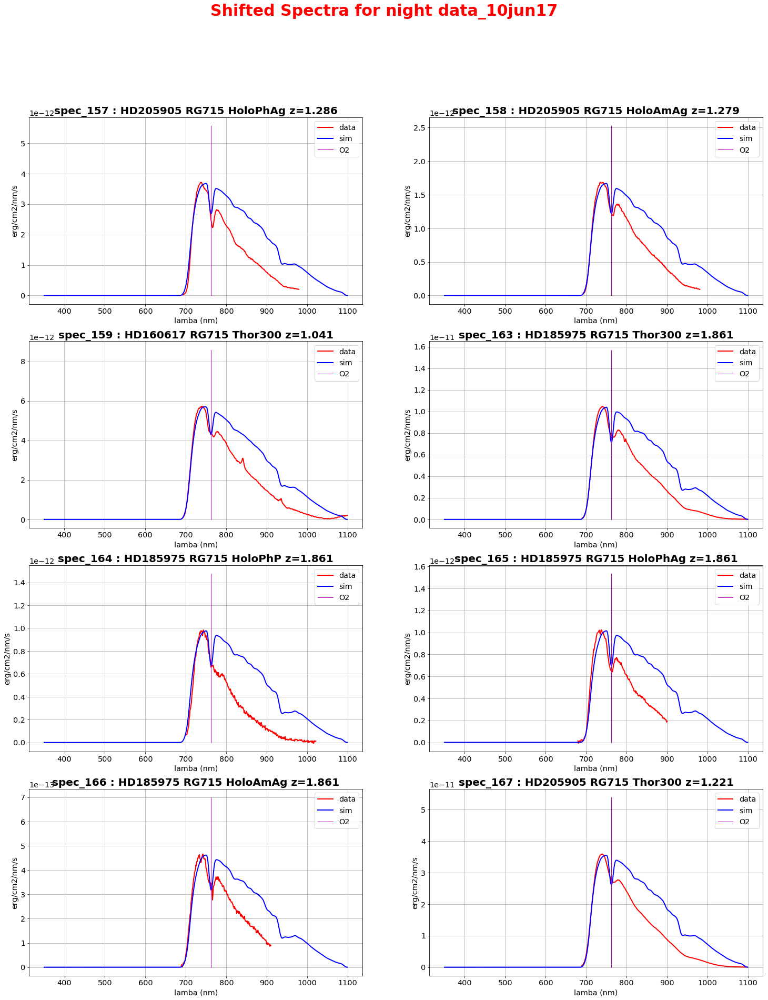

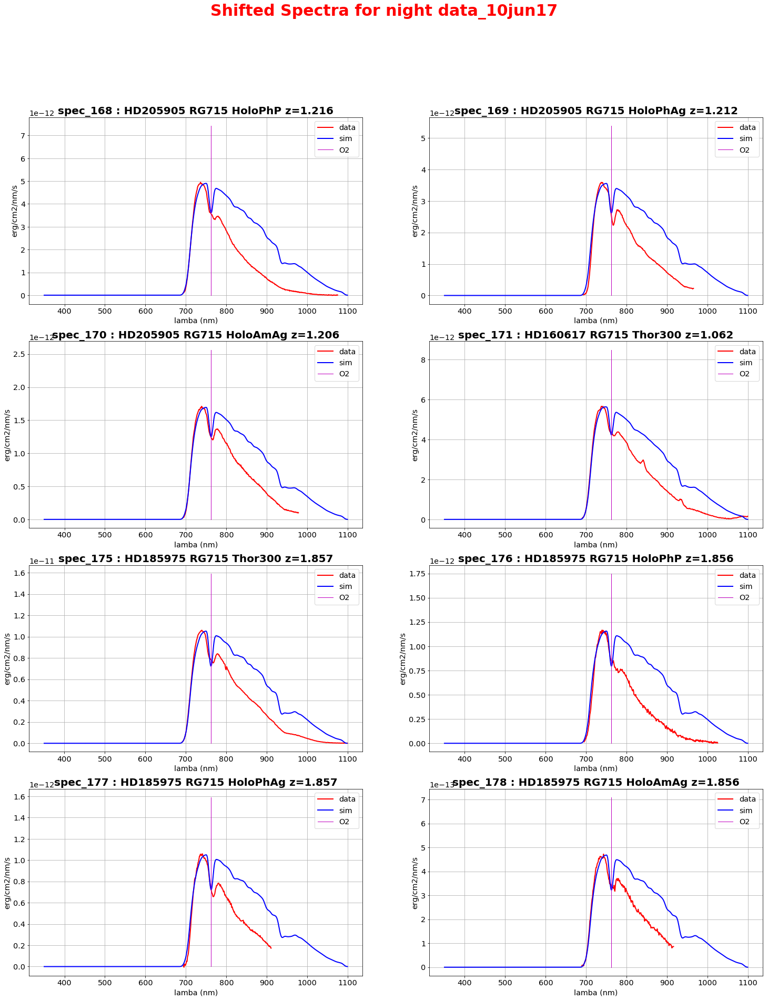

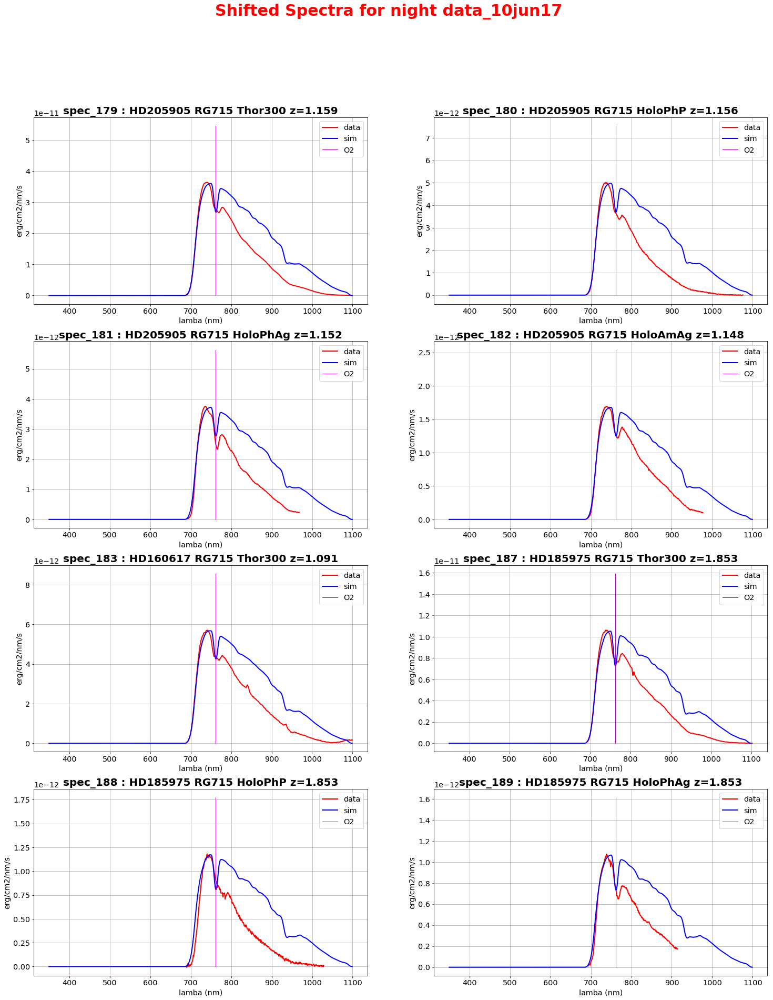

...

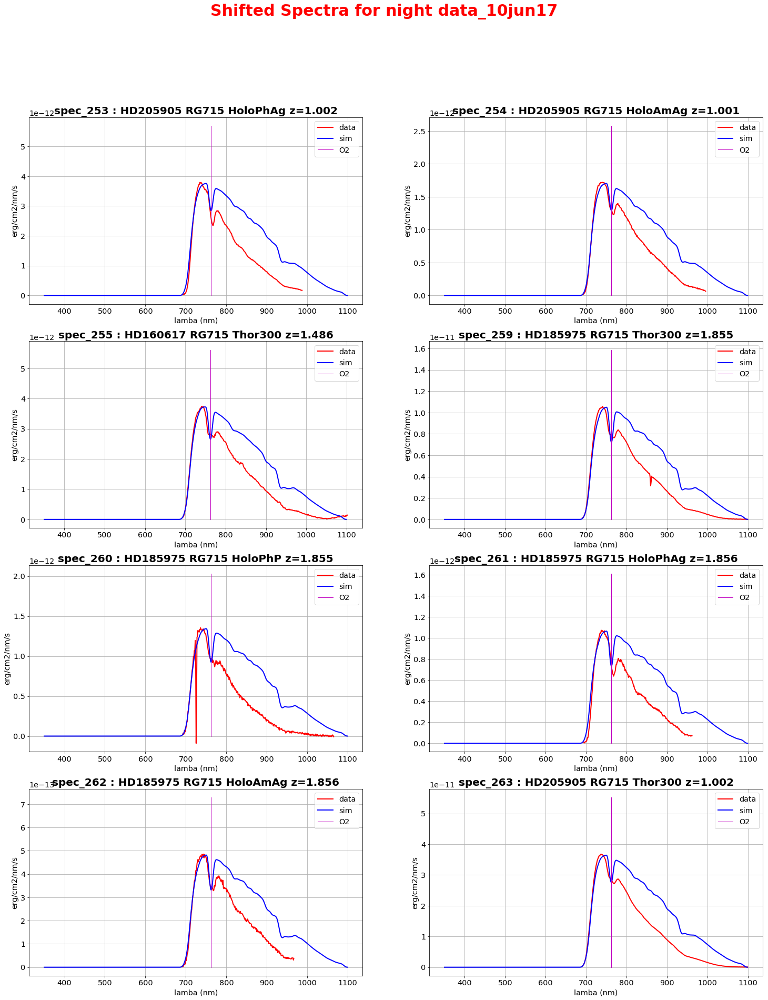

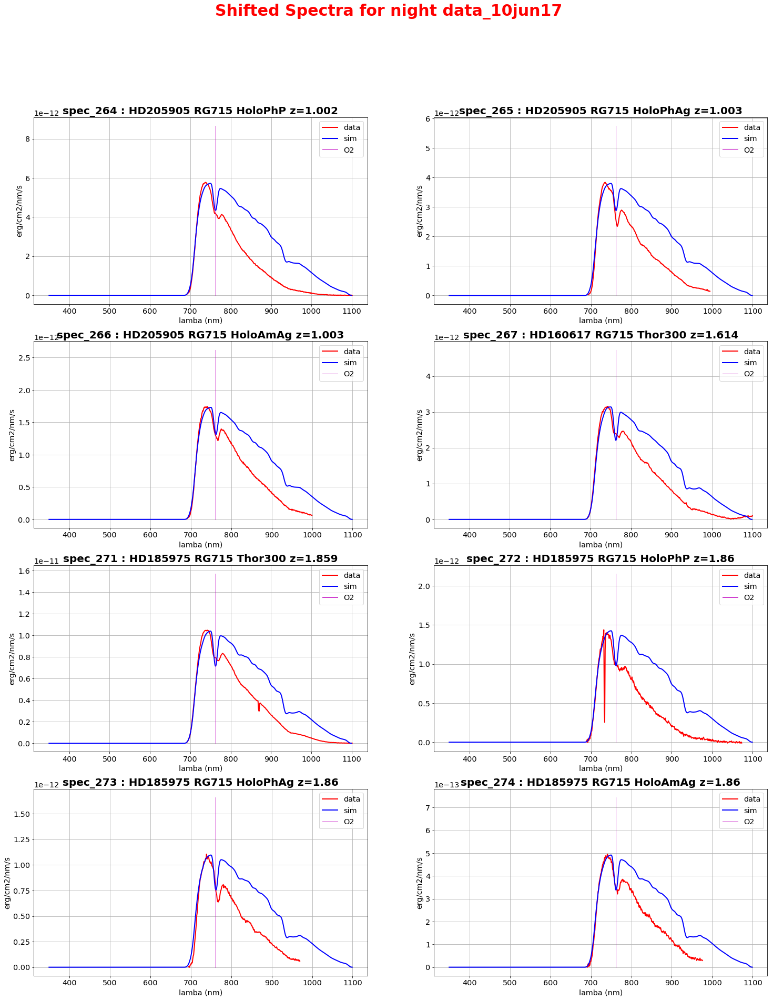

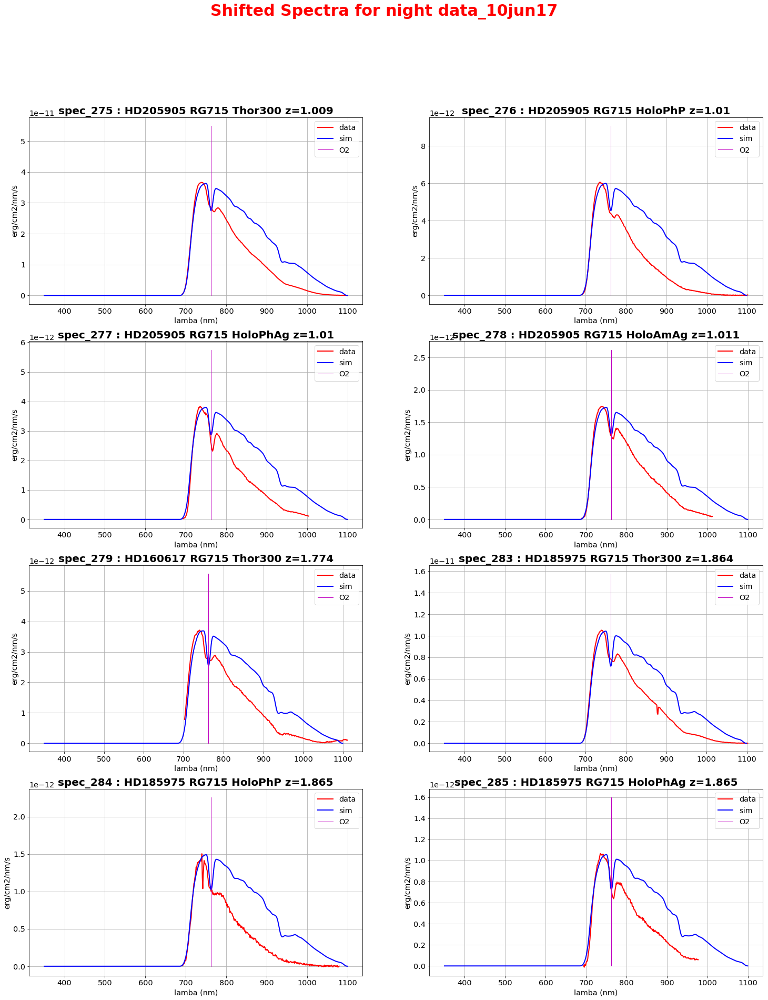

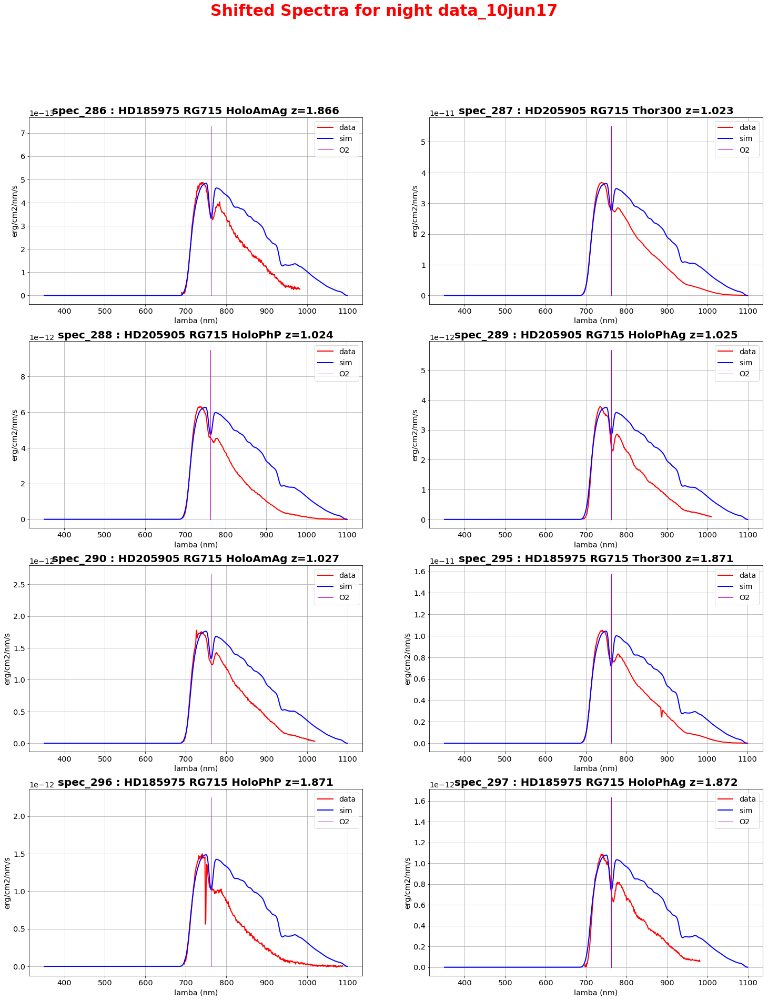

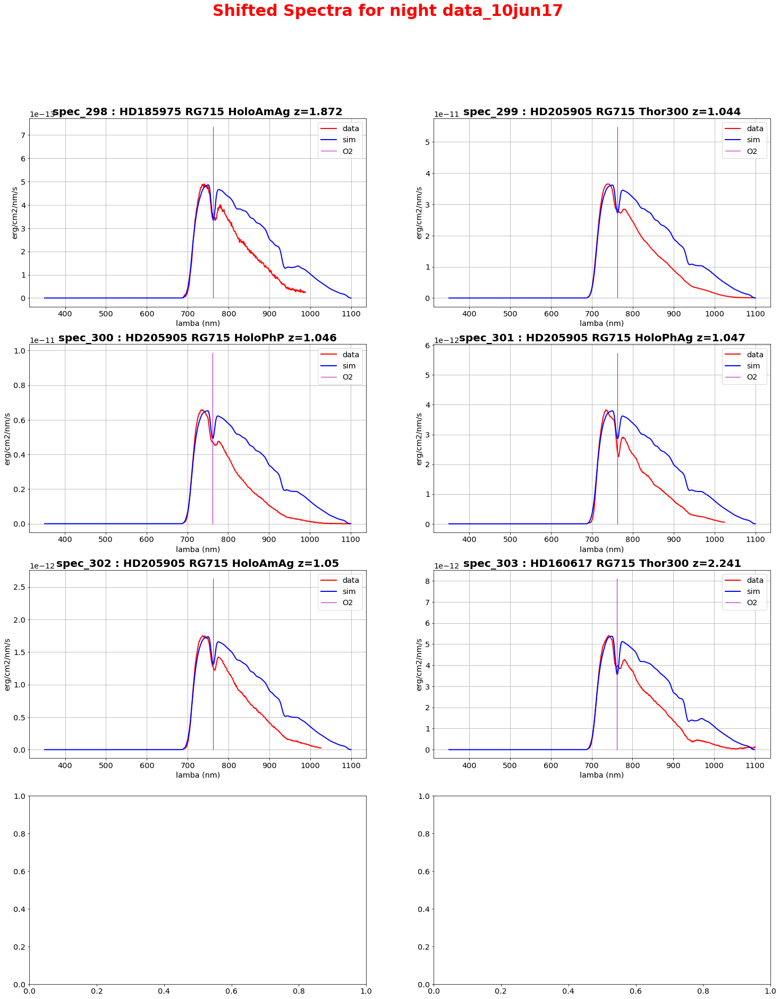

In [73]:
NBPLOTS=NBSPECTRA

title='Shifted Spectra for night '+All_Subdirs[idx_sel_subdir]
PageNum=0          # page counter
NBIMGPERROW=2
NBIMGROWPERPAGE=4

figfilename=os.path.join('ShiftedSpectra.pdf')
pp = PdfPages(figfilename) # create a pdf file

# loop on plots
for idx in np.arange(NBPLOTS):
    
    
    if idx%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,fontsize=30,fontweight='bold',color='red')
            
    # index of image in the page    
    index=idx-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
    ix=index%NBIMGPERROW
    iy=index/NBIMGPERROW
                        
    filename=all_spectrafiles[idx]
    file_id=get_index_from_filename(filename,SelectTagRe)
    
     # check if tthe index is in the disperser indexes 
    basefn=os.path.basename(filename)                  # basename of reconstruced spectra
    basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
    simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
    

    
    hdu1 = fits.open(filename)
    hdu2 = fits.open(simfilename)
       
    data1=hdu1[0].data
    head1=hdu1[0].header
    
    wl1=data1[0]
    f1=data1[1]
    ef1=data1[2]
   
    hdu2 = fits.open(simfilename)
    data2=hdu2[0].data
    
    wl2=data2[0]
    f2=data2[1]
    #f3=smooth(f2)
    f3=smooth(f2,window_len=21)
    
    gain=f1.max()/f2.max()
    
    # renormelize scale of simu
    f2=f3*gain




    # plot
    # --------    
    
    figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
    axarr[iy,ix].set_title(figtitle,fontsize='20',fontweight='bold')
    axarr[iy,ix].plot(wl1+all_wl_spec_shift[idx],f1,'r-',lw=2,label='data')
    axarr[iy,ix].plot(wl2,f2,'b-',lw=2,label='sim')

    
    axarr[iy,ix].plot([O2WL,O2WL],[0.,f1.max()*1.5],'m-',lw=1,label='O2')
    axarr[iy,ix].set_xlabel("lamba (nm)")
    axarr[iy,ix].set_ylabel("erg/cm2/nm/s")
    
    
    axarr[iy,ix].grid(True)
    #axarr[iy,ix].set_xlim(O2WL-100,O2WL+100) 
    axarr[iy,ix].legend() 
    
    hdu1.close()
    hdu2.close()
   
    # save a new page
    if (idx+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
        PageNum+=1  # increase page Number
        f.savefig(pp, format='pdf')
        f.show()
        #break
        
        
    #idx+=1    # increase counter on plots
     

f.savefig(pp, format='pdf') 
f.show()
pp.close()

# Save file

In [74]:
df=pd.DataFrame()

In [75]:
df["index"]=all_indexes
df["wlshift"]=all_wl_spec_shift

In [76]:
df=df.set_index("index")

In [77]:
df.to_csv('wavelength_shift.csv')

In [78]:
df.head()

,wlshift
index,
135,0.0
139,0.0
140,6.0
141,9.0
142,-2.0
